In [1]:
import pdb
import os
from os.path import join
import cv2
import torch
import pandas as pd
import numpy as np
from tqdm import tqdm
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader, Dataset
from albumentations import (Normalize, Compose)
from albumentations.pytorch import ToTensor
import torch.utils.data as data
import matplotlib.pyplot as plt

from segmentation_models_pytorch import Unet

In [2]:
def rle_to_mask(lre, shape=(1600,256)):
    '''
    params:  rle   - run-length encoding string (pairs of start & length of encoding)
             shape - (width,height) of numpy array to return 
    
    returns: numpy array with dimensions of shape parameter
    '''    
    # the incoming string is space-delimited
    runs = np.asarray([int(run) for run in lre.split(' ')])
    
    # we do the same operation with the even and uneven elements, but this time with addition
    runs[1::2] += runs[0::2]
    # pixel numbers start at 1, indexes start at 0
    runs -= 1
    
    # extract the starting and ending indeces at even and uneven intervals, respectively
    run_starts, run_ends = runs[0::2], runs[1::2]
    
    # build the mask
    h, w = shape
    mask = np.zeros(h*w, dtype=np.uint8)
    for start, end in zip(run_starts, run_ends):
        mask[start:end] = 1
    
    # transform the numpy array from flat to the original image shape
    return mask.reshape(shape)

def build_mask(encodings, labels):
    """ takes a pair of lists of encodings and labels, 
        and turns them into a 3d numpy array of shape (256, 1600, 4) 
    """
    
    # initialise an empty numpy array 
    mask = np.zeros((256,1600,4), dtype=np.uint8)
   
    # building the masks
    for rle, label in zip(encodings, labels):
        
        # classes are [1, 2, 3, 4], corresponding indeces are [0, 1, 2, 3]
        index = label - 1
        
        # fit the mask into the correct layer
        # note we need to transpose the matrix to account for 
        # numpy and openCV handling width and height in reverse order 
        mask[:,:,index] = rle_to_mask(rle).T
    
    return mask

def mask_to_contours(image, mask_layer, color):
    """ converts a mask to contours using OpenCV and draws it on the image
    """

    contours, hierarchy = cv2.findContours(mask_layer, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    image = cv2.drawContours(image, contours, -1, color, 2)
        
    return image

def visualise_mask(img_path, mask):
    """ open an image and draws clear masks, so we don't lose sight of the 
        interesting features hiding underneath 
    """
    
    # reading in the image
    image = cv2.imread(img_path)

    # going through the 4 layers in the last dimension 
    # of our mask with shape (256, 1600, 4)
    for index in range(mask.shape[-1]):
        
        # indeces are [0, 1, 2, 3], corresponding classes are [1, 2, 3, 4]
        label = index + 1
        
        # add the contours, layer per layer 
        image = mask_to_contours(image, mask[:,:,index], color=palette[label])   
        
    return image

In [3]:
import colorlover as cl
colors = cl.scales['4']['qual']['Set3']
labels = np.array(range(1,5))
palette = dict(zip(labels, np.array(cl.to_numeric(colors))))

import matplotlib.patches as mpatches

patches = []
for idx, color in palette.items():
    patch = mpatches.Patch(color=color/255, label='class {}'.format(idx))
    patches.append(patch)

In [20]:
# initialize test dataloader
best_threshold = 0.4
min_size = 700

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
test_transform = Compose(
    [
        Normalize(mean=mean, std=std, p=1),
        ToTensor(),
    ]
)
def preprocess_input(img_path, transform):
    image = cv2.imread(img_path)
    images = transform(image=image)["image"]
    return images

def post_process(probability, threshold, min_size):
    '''Post processing of each predicted mask, components with lesser number of pixels
    than `min_size` are ignored'''
    mask = cv2.threshold(probability, threshold, 1, cv2.THRESH_BINARY)[1]
    num_component, component = cv2.connectedComponents(mask.astype(np.uint8))
    predictions = np.zeros((256, 1600), np.float32)
    num = 0
    for c in range(1, num_component):
        p = (component == c)
        if p.sum() > min_size:
            predictions[p] = 1
            num += 1
    return predictions, num

In [21]:
# Initialize mode and load trained weights
ckpt_path = "./model_2nd_unet_60epochs.pth"
device = torch.device("cuda")
model = Unet("resnet18", encoder_weights=None, classes=4, activation=None)
model.to(device)
model.eval()
state = torch.load(ckpt_path, map_location=lambda storage, loc: storage)
model.load_state_dict(state["state_dict"])

<All keys matched successfully>

In [22]:
# reading in the training set
root_dir = "severstal-steel-defect-detection"
data = pd.read_csv(join(root_dir,'train.csv'))
data['ClassId'] = data['ClassId'].astype(np.uint8)

# keep only the images with labels
squashed = data.dropna(subset=['EncodedPixels'], axis='rows', inplace=True)

# squash multiple rows per image into a list
squashed = (
    data[['ImageId', 'EncodedPixels', 'ClassId']]
        .groupby('ImageId', as_index=False) 
        .agg(list) 
)

# count the amount of class labels per image
squashed['DistinctDefectTypes'] = squashed['ClassId'].apply(lambda x: len(x))

# display first ten to show new structure
squashed.head(10)

,ImageId,EncodedPixels,ClassId,DistinctDefectTypes
0,0002cc93b.jpg,[29102 12 29346 24 29602 24 29858 24 30114 24 ...,[1],1
1,0007a71bf.jpg,[18661 28 18863 82 19091 110 19347 110 19603 1...,[3],1
2,000a4bcdd.jpg,[37607 3 37858 8 38108 14 38359 20 38610 25 38...,[1],1
3,000f6bf48.jpg,[131973 1 132228 4 132483 6 132738 8 132993 11...,[4],1
4,0014fce06.jpg,[229501 11 229741 33 229981 55 230221 77 23046...,[3],1
5,0025bde0c.jpg,[8458 14 8707 35 8963 48 9219 71 9475 88 9731 ...,"[3, 4]",2
6,002af848d.jpg,[290800 6 291055 13 291311 15 291566 18 291822...,[4],1
7,002fc4e19.jpg,[146021 3 146275 10 146529 40 146783 46 147038...,"[1, 2]",2
8,0030401a5.jpg,[186833 1 187089 3 187344 6 187600 7 187855 10...,[4],1
9,0046839bd.jpg,[152926 1 153180 4 153434 6 153689 8 153943 11...,[3],1


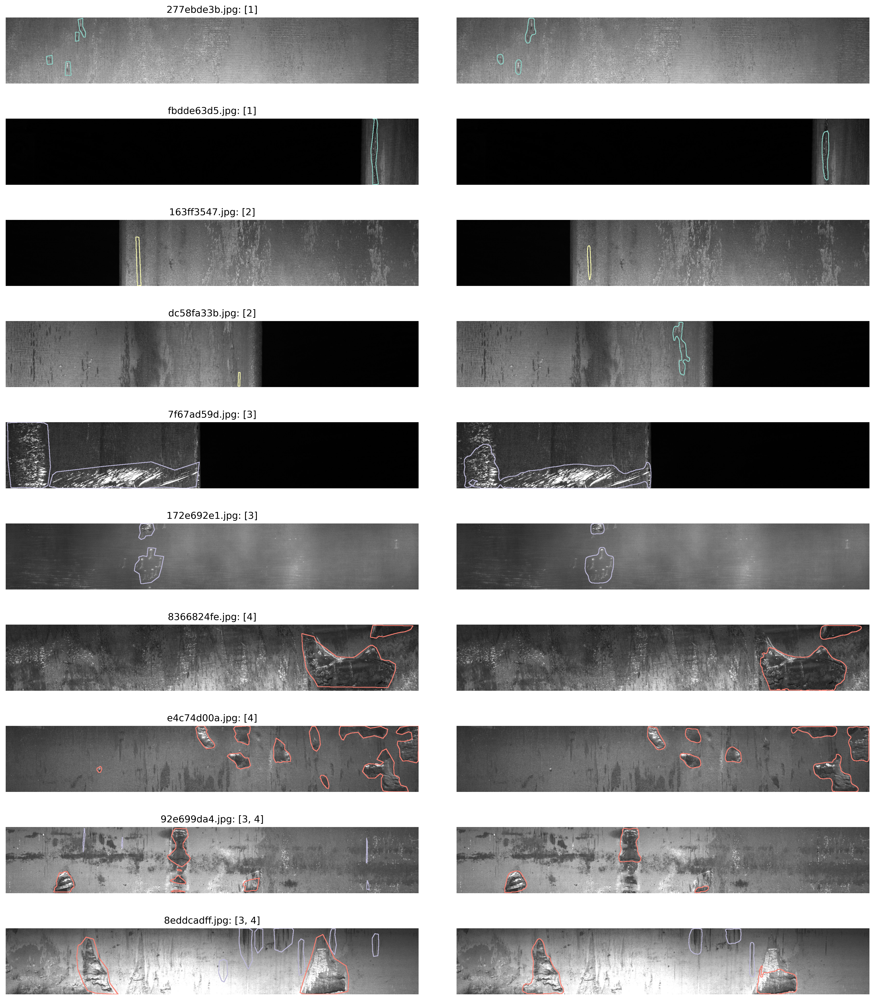

In [29]:
# the images we want to see
conditions = [
    squashed['ClassId'].astype(str)=='[1]',
    squashed['ClassId'].astype(str)=='[2]',
    squashed['ClassId'].astype(str)=='[3]',
    squashed['ClassId'].astype(str)=='[4]',
    squashed['DistinctDefectTypes']==2,
#     squashed['DistinctDefectTypes']==3
]

# max 2 due to limited population of [squashed['Distinct Defect Types']==3]
# remove that condition if you wish to increase the sample size, 
# or add replace=True to the .sample() method
sample_size = 2

fig, axes = plt.subplots(sample_size*5, 2, figsize=(16, sample_size*9), dpi = 400)
j = -1
# looping over the different combinations of labels 
for condition in conditions:
    j+=1
    # isolate from dataset and draw a sample
    sample = squashed[condition].sample(sample_size) 
    
    # make a subplot+
    fig.tight_layout()
    
    # looping over sample
    for i, (index, row) in enumerate(sample.iterrows()):
        
        # current ax
        ax = axes[j*2+i,0]
        img_path=join(root_dir,"train_images",row.ImageId)
        
        mask = build_mask(encodings=row.EncodedPixels, labels=row.ClassId)
        image = visualise_mask(img_path=img_path, mask=mask)
        
        # display
        ax.set_title(f'{row.ImageId}: {row.ClassId}')
        ax.axis('off')
        ax.imshow(image);
        
        # current ax
        ax = axes[j*2+i,1]
        img = preprocess_input(img_path, test_transform)
        img = img.unsqueeze(0)
        img = img.to(device)
        
        preds = torch.sigmoid(model(img))
        preds = preds.detach().cpu().numpy()
        
        predictions = []
        final_mask = []
        for cls, pred in enumerate(preds[0]):
            pred, num = post_process(pred, best_threshold, min_size)
            final_mask.append(pred)
            name = os.path.basename(img_path) + f"_{cls+1}"
            predictions.append([name, pred])
        final_mask = np.array(final_mask)
        final_mask = np.transpose(final_mask, (1,2, 0)).astype(np.uint8)
        final_img = visualise_mask(img_path=img_path, mask=final_mask)
        ax.axis('off')
        ax.imshow(final_img);
plt.savefig('val.jpg', bbox_inches='tight')
plt.show()